In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import os
import random
import glob
import sys
from torch.autograd import Variable
import numpy as np
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import models
from skimage.io import imread, imsave
from skimage.morphology import dilation
from skimage.morphology import disk
from skimage import transform
from torchvision.utils import make_grid
import cv2
import pickle
import torch.nn.functional as F

In [2]:
''' Calculate intersection over union as a performance metric'''
def cal_iou(predictions, gt):
    eps=1e-7
    intersection=np.sum(gt.astype('uint8') & predictions.astype('uint8'))
    union = np.sum(gt.astype('uint8') | predictions.astype('uint8'))
    
    return (intersection+eps)/(union+eps)

In [3]:
''' save the sample images'''
def save_grid(grid, name, cols=3, rows=3, Name=None):

    fig=plt.figure()
    n=-1
    for k in range(cols):
        
        for k_ in range(rows):
            n+=1
            plt.subplot(3,3, n+1)
            plt.imshow(grid[n])
            plt.axis('off')
            plt.axis('tight')
            plt.title(Name[n][0][:-4], fontsize=8)
    plt.show()
    plt.savefig(name)

In [4]:
''' sanity check for the required inputs to the network'''
def save_input_images(grid, name, cols=4, rows=7, Name=None):

    grid=grid.numpy()
    grid=np.transpose(grid, (0,2,3,1))
 
    fig=plt.figure()
    n=-1
    for k in range(0,cols,2):
        for k_ in range(0,rows,2):
            n+=1
            plt.subplot(5,2, k+k_+1)
            plt.imshow((grid[n,:,:,:3]))
            plt.axis('off')
            plt.axis('tight')
            plt.title(Name[n][0][:-4], fontsize=8)
            plt.subplot(5,2, k+k_+2)
            plt.imshow(grid[n,:,:,3])
            plt.axis('off')
            plt.axis('tight')
            plt.title(Name[n][0][:-4], fontsize=8)
    plt.show()
    plt.savefig(name)

In [5]:
''' Perform dilation, translation and scaling to generate the coarser maps from the current step. 
    Creating coarser maps on the fly'''
selem = disk(5)
def perform_dilation(maps, selem, phase='train'):
    x_translation=np.random.choice(np.linspace(-5,5,11))
    y_translation=np.random.choice(np.linspace(-5,5,11))
    scaling_factor=np.random.choice(np.linspace(0.75,1.25,5))
    tform = transform.AffineTransform(scale=(scaling_factor,scaling_factor),translation = (x_translation,y_translation)) ## for translation
    maps=[dilation(transform.warp(I, tform), selem) for I in maps]

    return np.array(maps)

In [6]:
''' Merge the input image and coarser map '''
def merge_maps(images, maps, axis, save_plot=False, Name=None, phase=None):

    
    if save_plot:
        save_grid(maps, 'map_grid.png', Name=Name)

    maps=perform_dilation(maps, selem, phase=phase)

    if save_plot:
        save_grid(maps, 'dilated_grid.png', Name=Name)

    maps=torch.unsqueeze(transforms.functional.normalize(torch.tensor(maps),mean = [0.485], std = [0.229]),1)


    if save_plot:
        save_input_images(torch.cat((images.float(), maps.float()), axis), 'inputs.png', Name=Name)
 
    return torch.cat((images.float(), maps.float()), axis)

In [7]:
'''Augmentation of the input images on the fly with a given probability'''
class ResizeRotationScaling(object):

    def __init__(self, height=480, width=854, prob=0.4):
       

        self.width=width
        self.height=height
        self.prob=prob

    def __call__(self, image_dicts):
        
        image=image_dicts['image']
        label=image_dicts['label']

     
   
        if self.prob> np.random.rand(1):

            rotation_angle = np.random.choice(np.linspace(-30,30,30))
            scaling_factor=np.random.choice(np.linspace(0.75,1.25,10))

            rotation_matrix = cv2.getRotationMatrix2D((self.width/2, self.height/2), rotation_angle, scaling_factor)

            

            

            label = cv2.warpAffine(label, rotation_matrix, (self.width, self.height), flags=cv2.INTER_NEAREST)
            image = cv2.warpAffine(image, rotation_matrix, (self.width, self.height), flags=cv2.INTER_CUBIC)

        

        return image, label

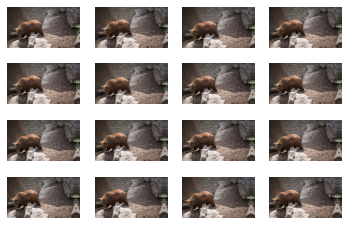

In [68]:
'''Some augmentations that didnt work. Extending the last frame with translations'''
for k in range(16):
    I=imread('/mnt/drive2/shiv/semi_supervised_segmentation/bear/00081_'+str(k+1)+'.jpg')
    plt.subplot(4,4,k+1)
    plt.imshow(I)
    plt.axis('off')
plt.show()

In [9]:
''' Balanced binary cross entropy loss for handling class imbalance'''

def balanced_loss(outputs, labels):
 
    pos_labels=torch.sum(labels)
    neg_labels=torch.sum(1.0 - labels)
    total_labels=pos_labels+neg_labels

    prob_1=torch.log(torch.sigmoid(outputs)+1e-10)
    prob_0=torch.log(1-torch.sigmoid(outputs)+1e-10)
    

    cross_entropy_1 = torch.sum(-torch.mul(labels, prob_1))
    cross_entropy_0 = torch.sum(-torch.mul(1.0 - labels, prob_0))

    loss = neg_labels/total_labels * cross_entropy_1 + pos_labels/total_labels * cross_entropy_0

    loss/=labels.shape[0]


    return loss


In [9]:
'''MaskTrack Dataloader. Loading images at the class level'''

class BasicDataset(Dataset):
    def __init__(self,class_dict, image_dict, phase='train'):
        self.class_dict=class_dict
        self.image_dict=image_dict
        self.image_size_height=480
        self.image_size_width=854
        self.phase=phase
        self.scaling_transforms=ResizeRotationScaling()
     
                                                    
        self.custom_transform = transforms.Compose([ transforms.ToPILImage(),
                                                    # transforms.Resize([self.image_size_height,self.image_size_width]),
                                                    transforms.ToTensor(),
                                                    transforms.Normalize(mean = [0.485, 0.456, 0.406], \
                                                                         std = [0.229, 0.224, 0.225]) ])

        self.num_classes=len(self.class_dict)

    def __len__(self):
        return self.num_classes

    def __getitem__(self, idx):

        class_name=self.class_dict[idx]
        images=self.image_dict[class_name]

        class_bag=torch.zeros(len(images), 3, self.image_size_height,self.image_size_width)
        label_bag=np.zeros((len(images), self.image_size_height,self.image_size_width))

        name_bags=[]

        counter=-1
        for image_name in images:
            counter+=1
            image=imread('../DAVIS2017_dataset/'+ self.phase + '_orig/data/'+ class_name+'/' +image_name)

            label=imread('../DAVIS2017_dataset/GT_binary/'+ class_name+'/' +image_name[:-3]+'png')
            label = cv2.resize(label, (self.image_size_width,self.image_size_height), \
                               interpolation = cv2.INTER_NEAREST)

            label[label==255]=1
            label[label!=1]=0


            image = cv2.resize(image, (self.image_size_width,self.image_size_height), \
                               interpolation = cv2.INTER_CUBIC)

            if self.phase=='train':
                image, label=self.scaling_transforms({'image': image, 'label': label})


            image=self.custom_transform(image)

            class_bag[counter]=image

            label_bag[counter]=label

            name_bags.append(class_name+'_'+image_name)

        return class_bag, label_bag, name_bags

In [10]:
 """Computes and stores the average and current value"""
class AverageMeter(object):
    def __init__(self):
        self.reset()
    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [11]:
def initialize_model():
    model = models.segmentation.deeplabv3_resnet50(pretrained=True)
    model.backbone.conv1=nn.Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    model.classifier[4] = nn.Conv2d(256, 1 ,kernel_size=(1, 1), stride=(1, 1))
    return model

In [12]:
''' hyperparameters'''

batch_size=1
aux_batch_size=10 ##train batch size
val_aux_batch_size=1
num_classes=1
learning_rate=.001
total_epochs=65
num_classes=1
criterion=nn.BCEWithLogitsLoss()

In [13]:
## create train dataset loader
with open('../DAVIS2017_dataset/train_dicts/class_dict.pickle', 'rb') as f:
        train_class_dict = pickle.load(f) 
with open('../DAVIS2017_dataset/train_dicts/image_dict.pickle', 'rb') as f:
        train_images_dict = pickle.load(f)

train_dataset = BasicDataset(train_class_dict,train_images_dict, phase='train')
train_dataset_loader = DataLoader(train_dataset,batch_size=batch_size, shuffle=True, num_workers=8)

In [14]:
## create val dataset loader
with open('../DAVIS2017_dataset/val_dicts/class_dict.pickle', 'rb') as f:
        val_class_dict = pickle.load(f) 
with open('../DAVIS2017_dataset/val_dicts/image_dict.pickle', 'rb') as f:
        val_images_dict = pickle.load(f)
val_dataset = BasicDataset(val_class_dict,val_images_dict, phase='val')
val_dataset_loader = DataLoader(val_dataset,batch_size=batch_size, shuffle=False, num_workers=8)

In [15]:
# ''' using a pretrained inceptionV3 model'''
# model = models.segmentation.deeplabv3_resnet50(pretrained=True)

# ''' modify according to the number of classes and input channels'''
# ''' Insert new filter in the input layer for extra channel'''
# old_weights=(model.backbone.conv1.weight)
# new_filter=torch.randn(64,1,7,7)
# updated_weights=torch.cat((old_weights, new_filter),1)
# new_input_layer=nn.Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
# new_input_layer.weights=updated_weights
# model.backbone.conv1=new_input_layer

# '''modify output layer'''

# model.classifier[4] = nn.Conv2d(256, 1 ,kernel_size=(1, 1), stride=(1, 1))
model=initialize_model()
model.cuda()
model=nn.DataParallel(model)

In [16]:
'''optimizer'''
# optimizer_s=optim.Adam(model.parameters(), lr=learning_rate)
optimizer_s=optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=.00005)

''' learning rate scheduler'''
def lr_scheduler(optimizer, init_lr, epoch):

    for param_group in optimizer.param_groups:

        if  epoch == 30 or epoch == 50 or epoch==60:
            param_group['lr']=param_group['lr']/10

        if epoch == 0:
            param_group['lr']=init_lr

        print('Current learning rate is {}'.format(param_group['lr']))


    return optimizer

Current learning rate is 0.001


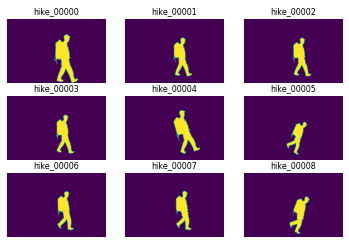

<Figure size 432x288 with 0 Axes>

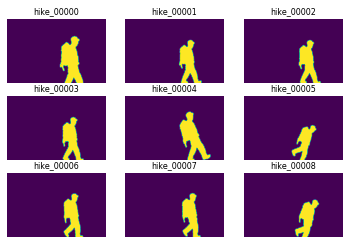

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/sh

<Figure size 432x288 with 0 Axes>

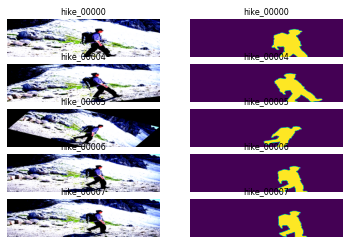

RuntimeError: Caught RuntimeError in replica 0 on device 0.
Original Traceback (most recent call last):
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/parallel/parallel_apply.py", line 61, in _worker
    output = module(*input, **kwargs)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torchvision/models/segmentation/_utils.py", line 20, in forward
    features = self.backbone(x)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torchvision/models/_utils.py", line 63, in forward
    x = module(x)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/container.py", line 117, in forward
    input = module(input)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torchvision/models/resnet.py", line 108, in forward
    out = self.conv2(out)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/conv.py", line 423, in forward
    return self._conv_forward(input, self.weight)
  File "/home/shiv/anaconda3/envs/shiv-venv/lib/python3.6/site-packages/torch/nn/modules/conv.py", line 420, in _conv_forward
    self.padding, self.dilation, self.groups)
RuntimeError: CUDA out of memory. Tried to allocate 32.00 MiB (GPU 0; 10.91 GiB total capacity; 4.37 GiB already allocated; 19.19 MiB free; 4.40 GiB reserved in total by PyTorch)


<Figure size 432x288 with 0 Axes>

In [16]:
''' Training and validation '''
max_iou=0.0
for epoch in range(total_epochs):
    train_losses = AverageMeter()
    train_iou = AverageMeter()
    optimizer  = lr_scheduler(optimizer_s, learning_rate, epoch)
    model.train()
    for j, (image_bag, label_bag, name_bag) in enumerate(train_dataset_loader):
   
        image_bag=image_bag.squeeze()
        label_bag=label_bag.squeeze()
    
        k_=-1
        for _ in range(0, image_bag.shape[0], aux_batch_size):
            # 
            k_+=1
            images=image_bag[k_*aux_batch_size:(k_+1)*aux_batch_size] if (k_+1)*aux_batch_size < image_bag.shape[0] else image_bag[k_*aux_batch_size:]
            labels=label_bag[k_*aux_batch_size:(k_+1)*aux_batch_size] if (k_+1)*aux_batch_size < label_bag.shape[0] else label_bag[k_*aux_batch_size:]

            if epoch==0 and j==0 and k_==0:
               
                images=merge_maps(images.float(),labels,1, True, name_bag, phase='train')
            else:
                
                images=merge_maps(images.float(), labels,1, phase='train')


      
            if images.shape[0]==1:
                images=torch.cat((images, images,images, images), dim=0)
                labels=torch.cat((labels, labels,labels, labels), dim=0)
            elif images.shape[0]==2 or images.shape[0]==3:
                images=torch.cat((images, images), dim=0)
                labels=torch.cat((labels, labels), dim=0)

            images=Variable(images.float().cuda(), requires_grad=True)
            labels=Variable(labels.float().cuda(), requires_grad=False)
      
            model_outputs=model(images)['out'].squeeze()

            
            optimizer.zero_grad()


            # loss=criterion(model_outputs, labels)
          

            loss=balanced_loss(model_outputs.squeeze(1),labels.squeeze(1))

            
            train_losses.update(loss.item(), images.size(0))

   

            loss.backward()
            optimizer.step()

            previous_predictions=torch.unsqueeze(torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu(),0)

            train_iou.update(cal_iou(labels.data.cpu().numpy().ravel(),\
            torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu().numpy().ravel()), images.size(0))

          

            if k_<20:
                imsave('train_predictions/'+ name_bag[k_][0], (255*previous_predictions[0,0].numpy()).astype('uint8'))
    

    
    val_predictions=[]
    val_labels=[]
    val_losses = AverageMeter()
    val_iou=AverageMeter()
    model.eval()
    for j, (image_bag, label_bag, name_bag) in enumerate(val_dataset_loader):
        image_bag=image_bag.squeeze(0)
        label_bag=label_bag.squeeze(0)

 
        k_=-1
        
        for _ in range(0, image_bag.shape[0], val_aux_batch_size):
            k_+=1
            images=image_bag[k_*val_aux_batch_size:(k_+1)*val_aux_batch_size] if (k_+1)*val_aux_batch_size < image_bag.shape[0] else image_bag[k_*val_aux_batch_size:]
            labels=label_bag[k_*val_aux_batch_size:(k_+1)*val_aux_batch_size] if (k_+1)*val_aux_batch_size < label_bag.shape[0] else label_bag[k_*val_aux_batch_size:]
  
            images=torch.cat((images, images), dim=0)
            labels=torch.cat((labels, labels), dim=0)
        
            with torch.no_grad():
                if k_==0:
                    
                    images=merge_maps(images.float(), labels,1, phase='val')
                else:
                    
                    images=merge_maps(images, previous_predictions,1, phase='val')

                images=Variable(images.float().cuda(), requires_grad=True)
                labels=Variable(labels.float().cuda(), requires_grad=False)
                model_outputs=model(images)['out'].squeeze()

               
                # loss=criterion(model_outputs, labels.squeeze(0))

                loss=balanced_loss(model_outputs.squeeze(1),labels.squeeze(1))
                
                val_losses.update(loss.item(), images.size(0))
                val_iou.update(cal_iou(labels.data.cpu().numpy().ravel(), \
                    torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu().numpy().ravel()), images.size(0))
                
                previous_predictions=(torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu())

    
    print('*'*20)
    print('epoch: {}, train_loss {} valid_loss: {} '.format(epoch, train_losses.avg, val_losses.avg))
    print('epoch: {}, train_iou {} valid_iou: {} '.format(epoch, train_iou.avg, val_iou.avg))
    print('*'*20)

    if val_iou.avg>max_iou:
        max_iou=val_iou.avg
        torch.save(model.state_dict(), 'weights/model_best')
        
torch.save(model.state_dict(), 'weights/model_final')

In [77]:
''' Make Predictions on the Test data'''

''' Load the pretrained weights'''
# model = models.segmentation.deeplabv3_resnet50(pretrained=True)
# model.backbone.conv1=nn.Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
# model.classifier[4] = nn.Conv2d(256, 1 ,kernel_size=(1, 1), stride=(1, 1))
model=initialize_model()
model.cuda()
model=nn.DataParallel(model)

model.load_state_dict(torch.load('weights/first_best'))

<All keys matched successfully>

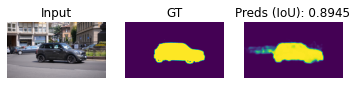

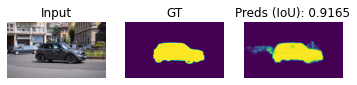

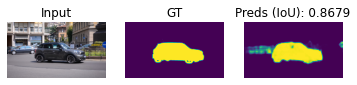

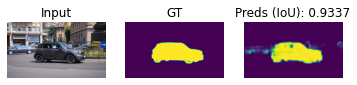

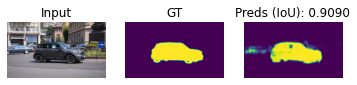

...

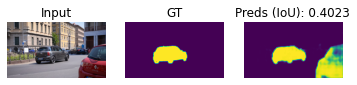

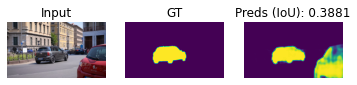

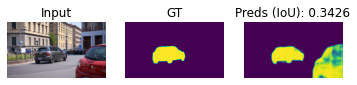

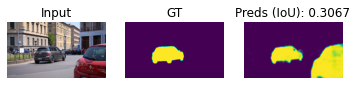

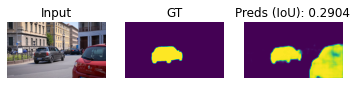

IoU_car-roundabout: 0.8211504206593525


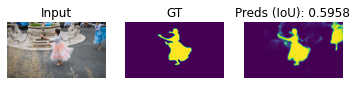

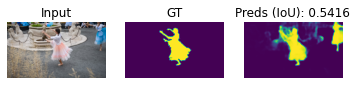

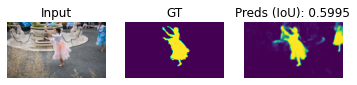

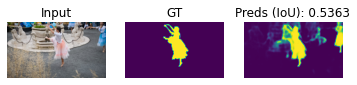

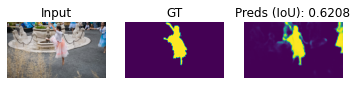

...

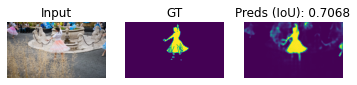

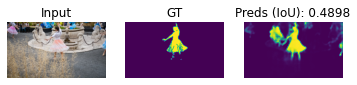

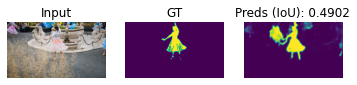

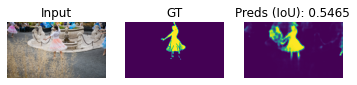

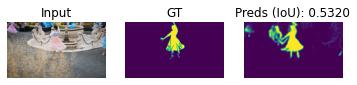

IoU_dance-jump: 0.615646615510996


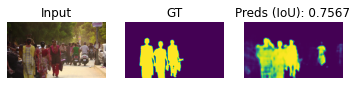

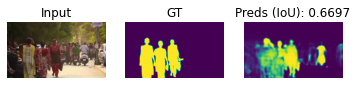

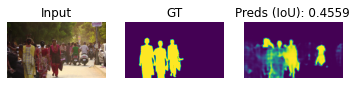

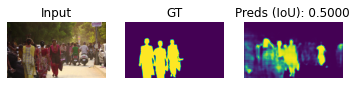

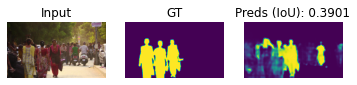

...

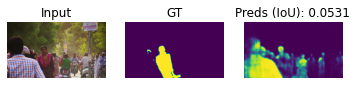

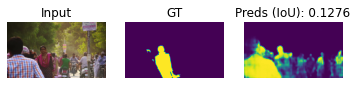

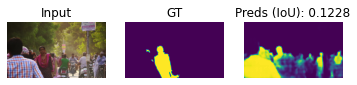

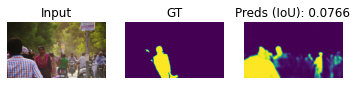

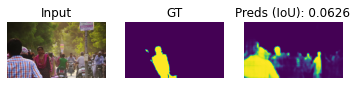

IoU_india: 0.2356212721417746


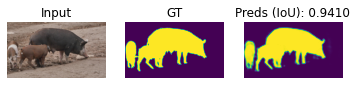

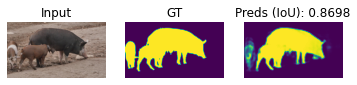

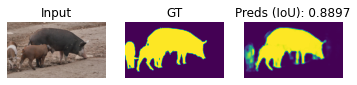

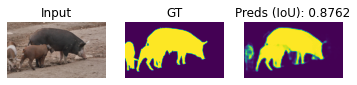

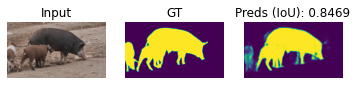

...

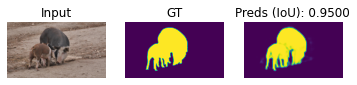

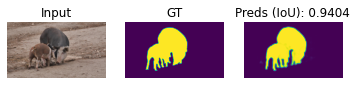

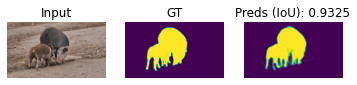

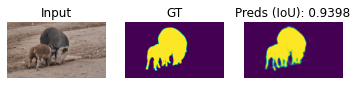

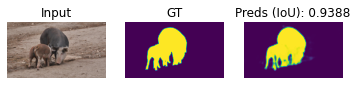

In [ ]:
test_dir='../DAVIS2017_dataset/test_orig/data'
gt_dir='../DAVIS2017_dataset/GT/'

folders=sorted(os.listdir(test_dir))
image_size_height=480
image_size_width=854
from sklearn.metrics import accuracy_score
import pickle
criterion=nn.BCEWithLogitsLoss()
verbose=True
val_losses = AverageMeter()
val_iou=AverageMeter()
val_f1=AverageMeter()
val_acc=AverageMeter()
model.eval()
for folder in folders:
    
    val_iou_class=AverageMeter()
   

 
    images=sorted(os.listdir(os.path.join(test_dir,folder)))
    gt_masks=sorted(os.listdir(os.path.join(gt_dir,folder)))


    val_predictions=[]
    val_labels=[]

  
    model.eval()

    k=-1

    for image in images:
        k+=1
        if k==0:
            first_mask=imread(((os.path.join(gt_dir,folder, gt_masks[0]))))
            if len(first_mask.shape)>2:
                first_mask=first_mask[:,:,:3]
                first_mask=np.sum(first_mask,2)
                first_mask[first_mask!=0]=1
        else: 
            first_mask=imread('current_map.png')

        first_mask = cv2.resize(first_mask, (image_size_width, image_size_height), interpolation = cv2.INTER_NEAREST)
        first_mask[first_mask==255]=1
        first_mask=torch.tensor(first_mask).float()
        first_mask=torch.unsqueeze(first_mask,0)

        input_image=imread((os.path.join(test_dir,folder,image)))
        input_image_model=transforms.functional.to_pil_image(input_image)
        input_image_model=transforms.functional.resize(input_image_model, (image_size_height, image_size_width))
        input_image_model=transforms.functional.to_tensor(input_image_model)
        input_image_model=transforms.functional.normalize(input_image_model,mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
        input_image_model=torch.unsqueeze(input_image_model,0)

        labels=imread(((os.path.join(gt_dir,folder, image[:-3]+'png'))))
        if len(labels.shape)>2:
            labels=labels[:,:,:3]
            labels=np.sum(labels,2)
            labels[labels!=0]=1
#             assert(labels==0 | labels==1).all()

        labels = cv2.resize(labels, (image_size_width, image_size_height), interpolation = cv2.INTER_NEAREST)
        labels[labels==255]=1
        labels_model=torch.tensor(labels).float()
        labels_model=torch.unsqueeze(labels_model,0)

        with torch.no_grad():
       
            images=merge_maps(input_image_model, first_mask,1)


            images=Variable(images.float().cuda())
            labels_model=Variable(labels_model.float().cuda())
         
            model_outputs=model(images)['out'].squeeze()
            
#             print(torch.unique(model_outputs))
        
            loss=criterion(model_outputs, labels_model.squeeze())

            val_losses.update(loss.item(), images.size(0))
            
            val_iou_class.update(cal_iou(labels_model.data.cpu().numpy().ravel(), \
                    torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu().numpy().ravel()), images.size(0))
            
           

            val_iou.update(cal_iou(labels_model.data.cpu().numpy().ravel(), \
                    torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu().numpy().ravel()), images.size(0))

#             val_acc.update(accuracy_score(labels_model.data.cpu().numpy().ravel(), \
#                     torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu().numpy().ravel()), images.size(0))

           
        
            first_mask=torch.unsqueeze(torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu(),0)
            
#             print(labels_model.shape)
#             print(model_outputs.shape)
#             print( input_image.shape)
            
            if verbose:
            
                plt.subplot(1,3,1)
                plt.imshow(input_image)
                
                plt.title('Input')
                plt.axis('off')
#             

                plt.subplot(1,3,2)
                plt.imshow((labels*255).astype('uint8'))
                plt.title('GT')
                plt.axis('off')
#         

                plt.subplot(1,3,3)
                plt.imshow(torch.sigmoid(model_outputs).data.cpu().numpy())
                plt.title('Preds (IoU): {:.4f}'.format(cal_iou(labels_model.data.cpu().numpy().ravel(), \
                    torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu().numpy().ravel())))
#              
                plt.axis('off')
#                
                
                plt.show()
                
                
                plt.pause(0.002)
                plt.close('all')
            
            

            imsave('predictions/'+folder+'_'+gt_masks[k], (255*first_mask[0].numpy()).astype('uint8'))

            imsave('current_map.png', (255*first_mask[0].numpy()).astype('uint8'))
            
    print('IoU_{}: {}'.format(folder, val_iou_class.avg))


    
print('*'*20)
print('valid_loss: {} '.format(val_losses.avg))
print('valid_iou: {} '.format(val_iou.avg))
print('*'*20)

In [20]:
'''one-shot online training'''
def merge_maps_online(images, maps, axis, save_plot=False, Name=None, phase=None):

    maps=perform_dilation_online(maps, selem, phase=phase)
    maps=torch.unsqueeze(transforms.functional.normalize(torch.tensor(maps),mean = [0.485], std = [0.229]),1)

    return torch.cat((images.float(), maps.float()), axis)
'''Only dilation is applied (no scaling or shifting)'''
def perform_dilation_online(maps, selem, phase='train'):
    maps=[dilation(I, selem) for I in maps]
    return np.array(maps)


In [69]:
class BasicDatasetOnline(Dataset):
    def __init__(self, class_name, height=480, width=854, n_shots=1, nos_angle=100, \
                 nos_scaling=10, mode='train'):

        self.class_name=class_name
        self.mode=mode

        self.image_width=width
        self.image_height=height

        self.gt_path='/mnt/drive2/shiv/semi_supervised_segmentation/test_images/GT/'
        self.image_path='/mnt/drive2/shiv/semi_supervised_segmentation/test_images/samples/'

        if self.mode=='train':
            
            self.images={}
            self.labels={}
            
            all_images=sorted(os.listdir(os.path.join(self.image_path, self.class_name)))[:n_shots]
            all_labels=sorted(os.listdir(os.path.join(self.gt_path, self.class_name)))[:n_shots]
            
            print(all_images)
            print(all_labels)
            
            for shot in range(n_shots):
            
                first_image=imread(self.image_path+'/'+self.class_name+'/'\
                                   +all_images[shot]).astype('uint8')
                first_label=imread(self.gt_path+'/'+ self.class_name + '/'\
                                   +all_labels[shot]).astype('uint8')
                
                if len(first_label.shape)>2:
                    first_label=first_label[:,:,:3]
                    first_label=np.sum(first_label,2)
                    first_label[first_label!=0]=1

                first_label[first_label==255]=1
                first_label[first_label!=1]=0

                

                rotation_angle = [np.random.choice(np.linspace(-30,30,30)) for k in range(nos_angle)]
                scaling_factor=[np.random.choice(np.linspace(0.75,1.25,10)) for k in range(nos_scaling)]

                counter=-1

                for angle in rotation_angle:
                    for scale in scaling_factor:
                        counter+=1
                        rotation_matrix = cv2.getRotationMatrix2D((self.image_width/2, self.image_height/2), angle, scale)
                        label = cv2.warpAffine(first_label, rotation_matrix, (self.image_width, self.image_height), flags=cv2.INTER_NEAREST)
                        image = cv2.warpAffine(first_image, rotation_matrix, (self.image_width, self.image_height), flags=cv2.INTER_CUBIC)

                        self.images[counter]=image
                        self.labels[counter]=label
        else:
            self.images=sorted(os.listdir(os.path.join(self.image_path, self.class_name)))
            self.labels=sorted(os.listdir(os.path.join(self.gt_path, self.class_name)))



        # print(self.labels)
        
        self.normalize = transforms.Compose([transforms.ToPILImage(),transforms.ToTensor(),
                                            transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]) ])

        




    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        if self.mode is not 'train':

            image_name=self.images[idx]

           

            image=imread(os.path.join(self.image_path, self.class_name,image_name))
            label=imread(os.path.join(self.gt_path, self.class_name,image_name[:-3]+'png')).astype('float32')
            
            if len(label.shape)>2:
                label=label[:,:,:3]
                label=np.sum(label,2)
                label[label!=0]=1
            
            label = cv2.resize(label, (self.image_width,self.image_height), \
                               interpolation = cv2.INTER_NEAREST)
            
            image = cv2.resize(image, (self.image_width,self.image_height), \
                               interpolation = cv2.INTER_NEAREST)

        
            label[label==255]=1
            label[label!=1]=0
    
            image=self.normalize(image)

        else:

            image=self.images[idx]
            label=self.labels[idx].astype('float32')
            
            
            
            label = cv2.resize(label, (self.image_width,self.image_height), \
                               interpolation = cv2.INTER_NEAREST)
            
            image = cv2.resize(image, (self.image_width,self.image_height), \
                               interpolation = cv2.INTER_NEAREST)
            
            

            # print(np.unique(label))

            image=self.normalize(image)


     

  
        return image, label



In [74]:
class_name='dance-jump'
save_dir='test_results'
seed = 2001
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

if not os.path.exists(save_dir):
    os.makedirs(os.path.join(save_dir))

epochs=500



model=initialize_model()
model.cuda()
model=nn.DataParallel(model)
model.load_state_dict(torch.load('./weights/first_best'))


train_dataset = BasicDatasetOnline(class_name=class_name, mode='train')
train_dataset_loader = DataLoader(train_dataset , batch_size=1, shuffle=True, num_workers=1)





optimizer = optim.SGD(model.parameters(), lr = 1e-8, momentum=0.9, weight_decay=.00005)

['00000.jpg']
['00000.png']


In [75]:
model.eval()

train_losses = AverageMeter()

counter=200
criterion=nn.BCEWithLogitsLoss()




for epoch in range(0, 1):

    for j, (images, labels) in enumerate(train_dataset_loader):


        images=merge_maps(images.float(), labels ,1, phase='train')

        images=torch.cat((images, images,images, images), dim=0)
        labels=torch.cat((labels, labels,labels, labels), dim=0)

        images=Variable(images.float().cuda(), requires_grad=True)
        labels=Variable(labels.float().cuda(), requires_grad=False)
        
        optimizer.zero_grad()

        model_outputs = model(images)['out']



        num_labels_pos = torch.sum(labels)
        num_labels_neg = torch.sum(1.0 - labels)
        pos_weight=1.0*num_labels_neg/num_labels_pos


        loss = balanced_loss(model_outputs.squeeze(1),labels.squeeze(1))

#         loss=criterion(torch.squeeze(model_outputs), labels)

        train_losses.update(loss.item(), images.size(0))
        
        
        
        loss.backward()
        optimizer.step()



        if j%counter==0:
            print('steps {} Current loss {}'.format(j, train_losses.avg))  
    
            
            

steps 0 Current loss 6771.21728515625
steps 200 Current loss 1797.9416033237135
steps 400 Current loss 1563.538105115629
steps 600 Current loss 1410.6520645217768
steps 800 Current loss 1326.599400666769


Using online model for testing


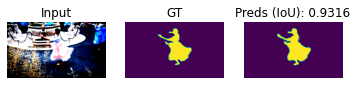

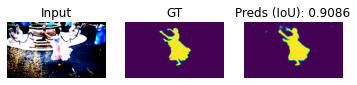

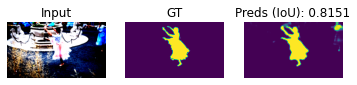

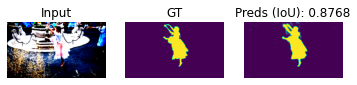

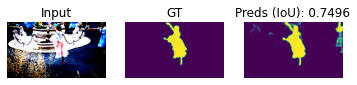

...

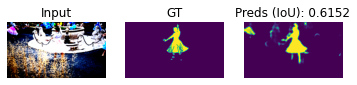

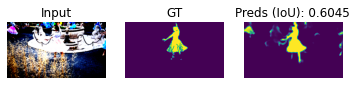

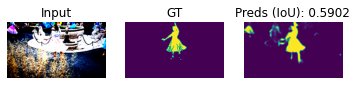

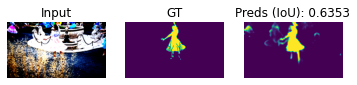

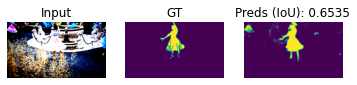

IoU after online training: 0.7212309062578116


In [76]:
save_dir_res = os.path.join(save_dir, 'Results', class_name)
if not os.path.exists(save_dir_res):
    os.makedirs(save_dir_res)

test_dataset = BasicDatasetOnline(class_name=class_name, mode='test')
test_dataset_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=1)
verbose=True
val_iou=AverageMeter()
model.eval()
print('Using online model for testing')

for j, (images, labels) in enumerate(test_dataset_loader):

    with torch.no_grad():
        if j==0:
            # print(labels.shape)
            images=merge_maps(images.float(), labels ,1, phase='train')
        else:
            # print(previous_predictions.shape)
            images=merge_maps(images.float(), torch.unsqueeze(previous_predictions,0) ,1, phase='train')

        images=Variable(images.float().cuda(), requires_grad=True)
        labels=Variable(labels.float().cuda(), requires_grad=False)
        model_outputs = model(images)['out']
        model_outputs=torch.sigmoid(model_outputs)
        model_outputs=torch.squeeze(model_outputs)
        
#         print(torch.unique(model_outputs))
        
        if verbose:
            
#                 print(images[0][:3].shape)
                image_=np.transpose((images[0][:3].data.cpu().numpy()), (1,2,0))
                image_[image_<0]=0
                image_[image_>1]=1
                                    
            
                plt.subplot(1,3,1)
                plt.imshow(image_)
                
                plt.title('Input')
                plt.axis('off')
#             

                plt.subplot(1,3,2)
                plt.imshow((labels[0].data.cpu().numpy()*255).astype('uint8'))
                plt.title('GT')
                plt.axis('off')
#         

                plt.subplot(1,3,3)
                plt.imshow(torch.sigmoid(model_outputs).data.cpu().numpy())
                plt.title('Preds (IoU): {:.4f}'.format(cal_iou(labels.data.cpu().numpy().ravel(), \
                    torch.ge(model_outputs, 0.5).float().data.cpu().numpy().ravel())))
#              
                plt.axis('off')
#                
                
                plt.show()
                
                
                plt.pause(0.002)
                plt.close('all')
        
        previous_predictions=(torch.ge(torch.sigmoid(model_outputs), 0.5).float().data.cpu())
        val_iou.update(cal_iou(labels.data.cpu().numpy().ravel(), \
                    torch.ge((model_outputs), 0.5).float().data.cpu().numpy().ravel()), images.size(0))
#         imsave(os.path.join(save_dir_res, str(j) + '.png'), \
#                torch.ge(torch.sigmoid(model_outputs),0.5).float().data.cpu().numpy())
print('IoU after online training: {}'.format(val_iou.avg))

In [ ]:
'''
Dance-Jumps (before online): 0.627
Dance-Jumps (after online): 0.729
India (before online): 0.245
India (after online):0.572
Pigs (befor online): 0.910
Pigs (after online): 0.955

'''